In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

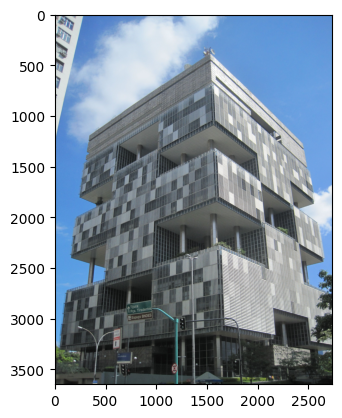

In [2]:
path = 'img/petro.jpg'
bib_img = cv2.imread(path)

# rgb está em BGR, converter para RGB

bib_img = cv2.cvtColor(bib_img, cv2.COLOR_BGR2RGB)

plt.imshow(bib_img)

C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1976895110.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1),plt.imshow(bib_img,cmap = 'gray')
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


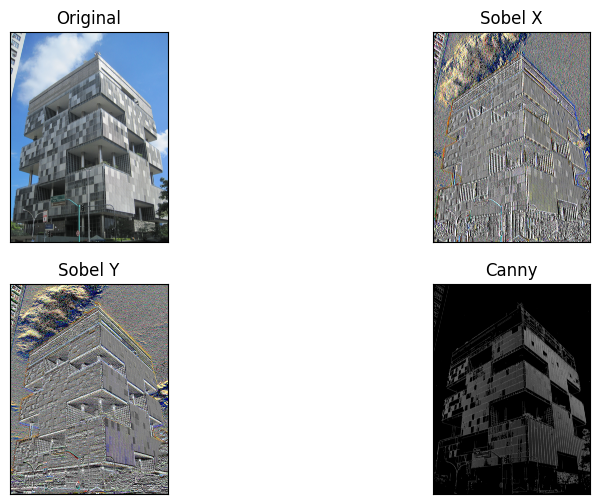

In [3]:

# sobel

sobelx = cv2.Sobel(bib_img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(bib_img,cv2.CV_64F,0,1,ksize=5)

# canny

edges = cv2.Canny(bib_img,100,200)

# plotando as imagens

# plt figure size

plt.figure(figsize=(10,6))

plt.title('Filtros clássicos de detecção de bordas')

plt.subplot(2,2,1),plt.imshow(bib_img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(edges,cmap = 'gray')
plt.title('Canny'), plt.xticks([]), plt.yticks([])

plt.show()

C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1806480314.py:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1),plt.imshow(bib_img,cmap = 'gray')
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


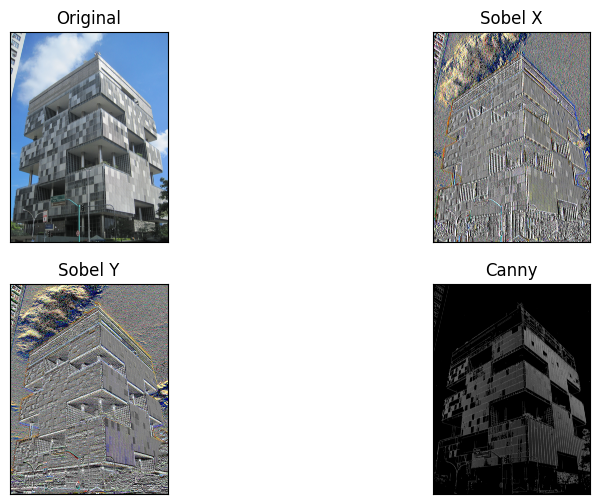

In [4]:
# export image to file

plt.figure(figsize=(10,6))

plt.title('Filtros clássicos de detecção de bordas')

plt.subplot(2,2,1),plt.imshow(bib_img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(edges,cmap = 'gray')
plt.title('Canny'), plt.xticks([]), plt.yticks([])

plt.savefig('img/bib_filtro.pdf', dpi=300, bbox_inches='tight')

In [5]:
def img_edge_detection2(img):
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    (H, W) = img.shape[:2]
    blob = cv2.dnn.blobFromImage(img)
    print(blob.shape)
    net = cv2.dnn.readNetFromCaffe("deploy.prototxt", "hed_pretrained_bsds.caffemodel")
    net.setInput(blob)
    hed = net.forward()
    hed = cv2.resize(hed[0, 0], (W, H))
    hed = (255 * hed).astype("uint8")
    return hed

def img_edge_detection(img):
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    (H, W) = img.shape[:2]
    # Altere o valor do fator de escala para um número entre 0 e 1
    scalefactor = 0.4
    blob = cv2.dnn.blobFromImage(img, scalefactor=scalefactor, size=(W, H),
        swapRB=False, crop=False)
    net = cv2.dnn.readNetFromCaffe("deploy.prototxt", "hed_pretrained_bsds.caffemodel")
    net.setInput(blob)
    hed = net.forward()
    hed = cv2.resize(hed[0, 0], (W, H))
    # converte para imagem binária
    hed = (255 * hed).astype("uint8")
    hed = cv2.threshold(hed, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    return hed

# test = img_edge_detection2(bib_img)

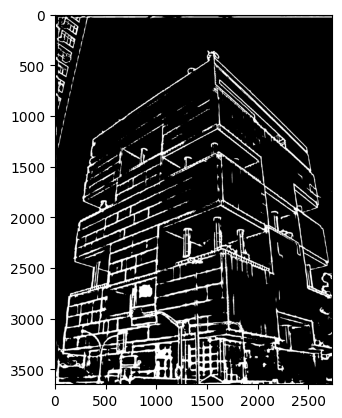

In [6]:
hed_bib = img_edge_detection(bib_img)

plt.imshow(hed_bib, cmap='gray')

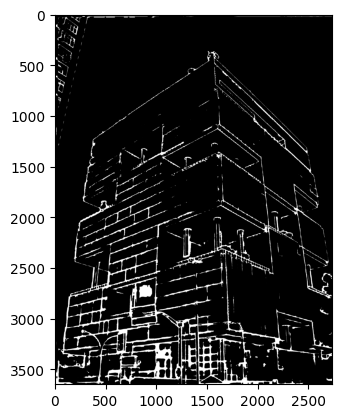

In [7]:
kernel = np.ones((6,6),np.uint8)
erosion = cv2.erode(hed_bib,kernel)

plt.imshow(erosion,cmap = 'gray')

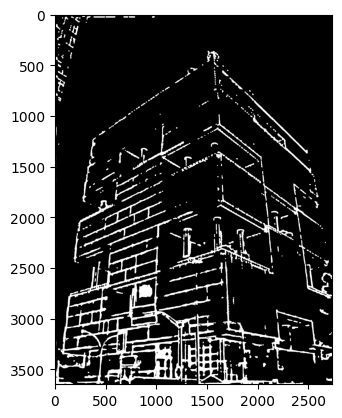

In [8]:
# opening

kernel = np.ones((9,9),np.uint8)

opening = cv2.morphologyEx(hed_bib, cv2.MORPH_OPEN, kernel)

plt.imshow(opening,cmap = 'gray')

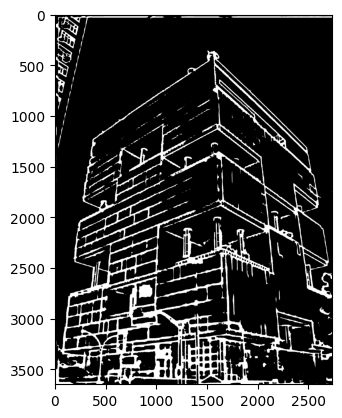

In [9]:
# closing

kernel = np.ones((9,9),np.uint8)
closing = cv2.morphologyEx(hed_bib, cv2.MORPH_CLOSE, kernel)

plt.imshow(closing,cmap = 'gray')

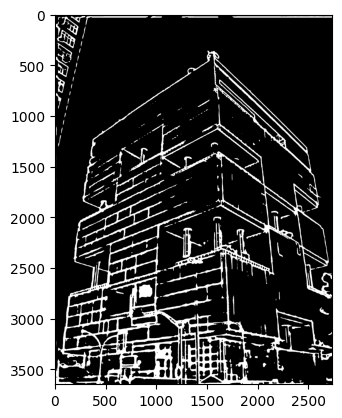

In [10]:
# median filter

median = cv2.medianBlur(hed_bib,9)

plt.imshow(median,cmap = 'gray')

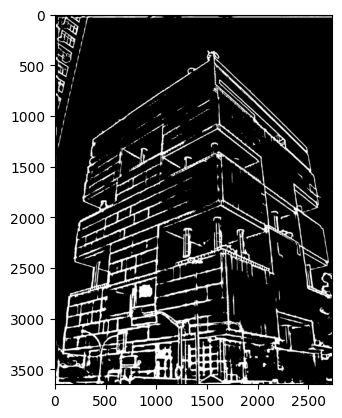

In [11]:
# gaussian filter

blur = cv2.GaussianBlur(hed_bib,(9,9),0)

plt.imshow(blur,cmap = 'gray')

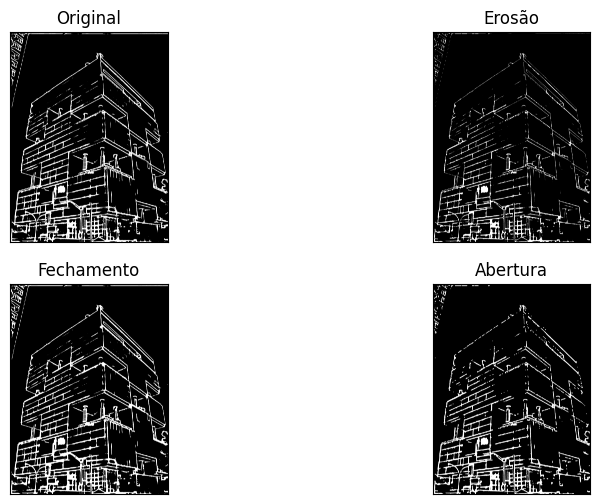

In [12]:
# plot 3 images

plt.figure(figsize=(10,6))

plt.subplot(2,2,1),plt.imshow(hed_bib,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(erosion,cmap = 'gray')
plt.title('Erosão'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(closing,cmap = 'gray')
plt.title('Fechamento'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(opening,cmap = 'gray')
plt.title('Abertura'), plt.xticks([]), plt.yticks([])

# save pdf

plt.savefig('img/bib_filtro2.pdf', dpi=300, bbox_inches='tight')

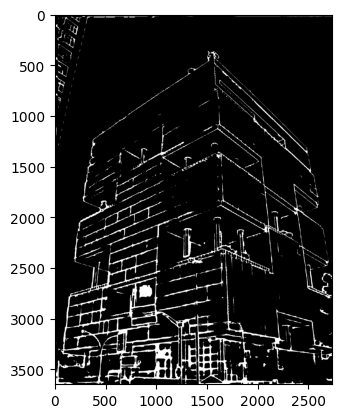

In [13]:
# aplly guassian filter on erosion

blur_ero = cv2.GaussianBlur(erosion,(5,5),0)

plt.imshow(blur_ero,cmap = 'gray')

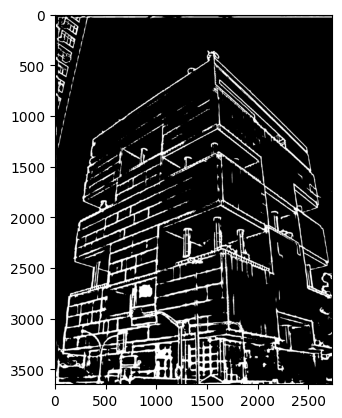

In [14]:
# blur on original image

blur_ori = cv2.GaussianBlur(hed_bib,(5,5),0)

plt.imshow(blur_ori,cmap = 'gray')

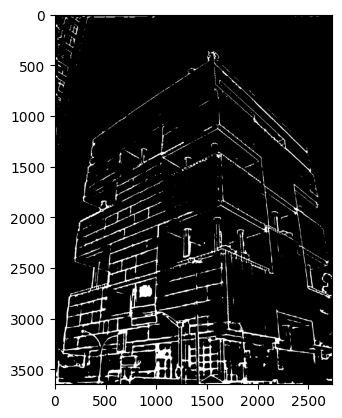

In [15]:
# apply median filter on erosion

median_ero = cv2.medianBlur(erosion,5)

plt.imshow(median_ero,cmap = 'gray')

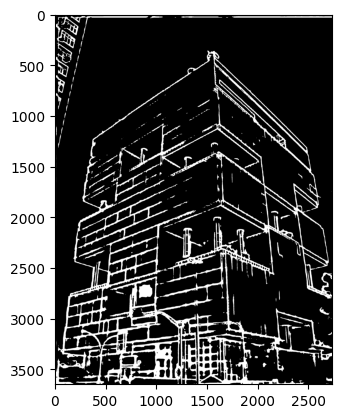

In [16]:
# apply median filter on original image

median_ori = cv2.medianBlur(hed_bib,5)

plt.imshow(median_ori,cmap = 'gray')

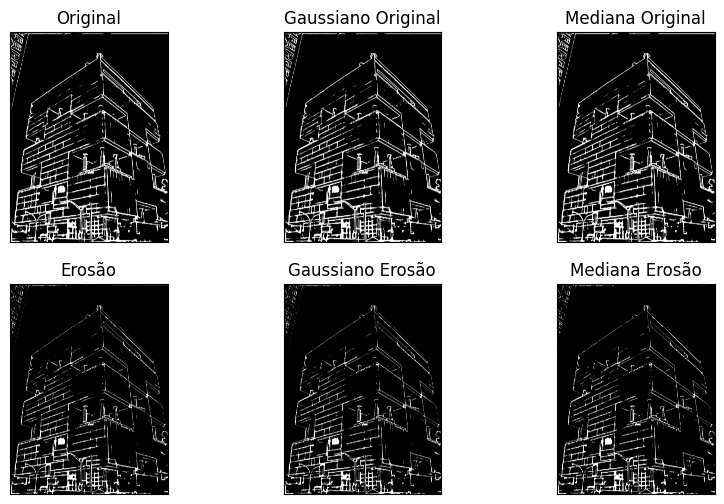

In [17]:
# plot 5 images

plt.figure(figsize=(10,6))

plt.subplot(2,3,1),plt.imshow(hed_bib,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,2),plt.imshow(blur_ori,cmap = 'gray')
plt.title('Gaussiano Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,3),plt.imshow(median_ori,cmap = 'gray')
plt.title('Mediana Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,4),plt.imshow(erosion,cmap = 'gray')
plt.title('Erosão'), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,5),plt.imshow(blur_ero,cmap = 'gray')
plt.title('Gaussiano Erosão'), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,6),plt.imshow(median_ero,cmap = 'gray')
plt.title('Mediana Erosão'), plt.xticks([]), plt.yticks([])
# save pdf

plt.savefig('img/blur.pdf', dpi=300, bbox_inches='tight')

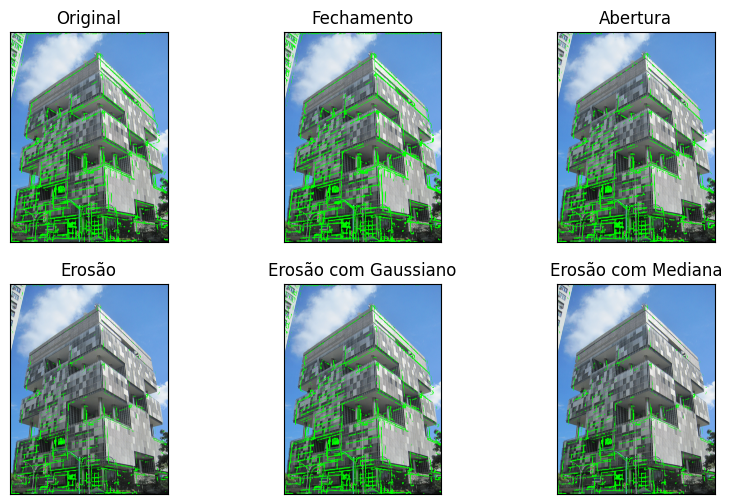

In [18]:
# transformada de hough probabilística em:
# imagem original, closing, opening, erosion, blur, median
plt.figure(figsize=(10,6))

rho = 1
theta = 1/2
threshold = 200
minLineLength = 10
maxLineGap = 10

# original

lines_ori = cv2.HoughLinesP(hed_bib,rho,theta,threshold,minLineLength,maxLineGap)

bib_img1 = bib_img.copy()

for line in lines_ori:
    x1,y1,x2,y2 = line[0]
    cv2.line(bib_img1,(x1,y1),(x2,y2),(0,255,0),2)
plt.subplot(2,3,1),plt.imshow(bib_img1,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

# closing
bib_img2 = bib_img.copy()

lines_closing = cv2.HoughLinesP(closing,rho,theta,threshold,minLineLength,maxLineGap)


for line in lines_closing:
    x1,y1,x2,y2 = line[0]
    cv2.line(bib_img2,(x1,y1),(x2,y2),(0,255,0),2)
plt.subplot(2,3,2),plt.imshow(bib_img2,cmap = 'gray')
plt.title("Fechamento"), plt.xticks([]), plt.yticks([])
# opening

bib_img3 = bib_img.copy()

lines_opening = cv2.HoughLinesP(opening,rho,theta,threshold,minLineLength,maxLineGap)

for line in lines_opening:
    x1,y1,x2,y2 = line[0]
    cv2.line(bib_img3,(x1,y1),(x2,y2),(0,255,0),2)

plt.subplot(2,3,3),plt.imshow(bib_img3,cmap = 'gray')
plt.title("Abertura"), plt.xticks([]), plt.yticks([])
# erosion

bib_img4 = bib_img.copy()

lines_erosion = cv2.HoughLinesP(erosion,rho,theta,threshold,minLineLength,maxLineGap)

for line in lines_erosion:
    x1,y1,x2,y2 = line[0]
    cv2.line(bib_img4,(x1,y1),(x2,y2),(0,255,0),2)

plt.subplot(2,3,4),plt.imshow(bib_img4,cmap = 'gray')
plt.title("Erosão"), plt.xticks([]), plt.yticks([])

# blur

bib_img5 = bib_img.copy()


lines_blur = cv2.HoughLinesP(blur_ero,rho,theta,threshold,minLineLength,maxLineGap)
for line in lines_blur:
    x1,y1,x2,y2 = line[0]
    cv2.line(bib_img5,(x1,y1),(x2,y2),(0,255,0),2)

plt.subplot(2,3,5),plt.imshow(bib_img5,cmap = 'gray')
plt.title("Erosão com Gaussiano"), plt.xticks([]), plt.yticks([])

# median

bib_img6 = bib_img.copy()


lines_median = cv2.HoughLinesP(median_ero,rho,theta,threshold,minLineLength,maxLineGap)

for line in lines_median:
    x1,y1,x2,y2 = line[0]
    cv2.line(bib_img6,(x1,y1),(x2,y2),(0,255,0),2)

plt.subplot(2,3,6),plt.imshow(bib_img6,cmap = 'gray')
plt.title("Erosão com Mediana"), plt.xticks([]), plt.yticks([])

# save pdf

plt.savefig('img/houghP.pdf', dpi=300, bbox_inches='tight')

(<Axes: >, <matplotlib.image.AxesImage at 0x1659d0ca210>)

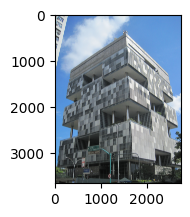

In [19]:
plt.subplot(2,3,6),plt.imshow(bib_img,cmap = 'gray')


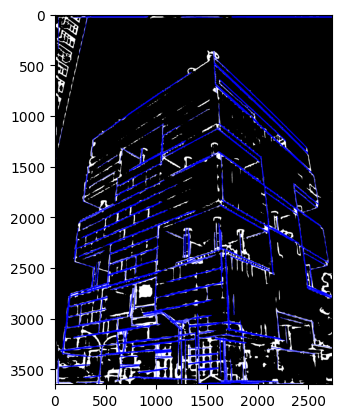

In [20]:
# hough transform probabilistico

kernel = np.ones((9,9), np.uint8)

closing = cv2.morphologyEx(hed_bib, cv2.MORPH_CLOSE, kernel)

hed_bib_closing = cv2.cvtColor(closing, cv2.COLOR_GRAY2BGR)

gray = cv2.cvtColor(hed_bib_closing, cv2.COLOR_BGR2GRAY)

W, H = gray.shape

lines = cv2.HoughLinesP(gray, 1, np.pi/180, 200, minLineLength=150, maxLineGap=10)

for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(hed_bib_closing, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.imshow(hed_bib_closing)

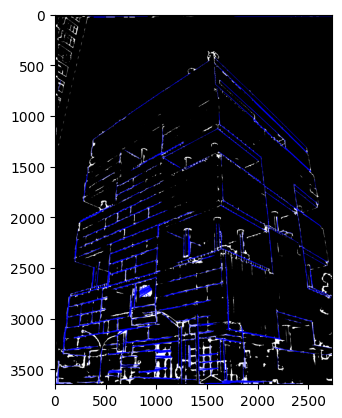

In [21]:
# hough transform probabilistico

kernel = np.ones((6,6),np.uint8)
erosion = cv2.erode(hed_bib,kernel)

plt.imshow(erosion,cmap = 'gray')

hed_bib2_erosion = cv2.cvtColor(erosion, cv2.COLOR_GRAY2BGR)

gray = cv2.cvtColor(hed_bib2_erosion, cv2.COLOR_BGR2GRAY)

lines = cv2.HoughLinesP(gray, 1, np.pi/180, 200, minLineLength=100, maxLineGap=10)

for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(hed_bib2_erosion, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.imshow(hed_bib2_erosion)

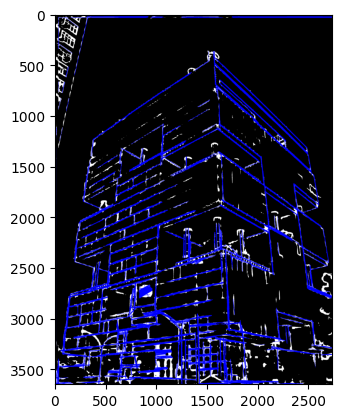

In [22]:
# hough transform probabilistico

kernel = np.ones((6,6), np.uint8)

closing = cv2.morphologyEx(hed_bib, cv2.MORPH_CLOSE, kernel)

hed_bib2 = cv2.cvtColor(closing, cv2.COLOR_GRAY2BGR)

gray = cv2.cvtColor(hed_bib2, cv2.COLOR_BGR2GRAY)

lines = cv2.HoughLinesP(gray, 1, np.pi/180, 200, minLineLength=100, maxLineGap=10)

for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(hed_bib2, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.imshow(hed_bib2)

In [23]:
# plt.imshow(test, cmap='gray')

In [24]:
hed_bib

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0]], dtype=uint8)

In [25]:
hed_bib.shape

(3648, 2736)

C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\2116190723.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1),plt.imshow(bib_img,cmap = 'gray')


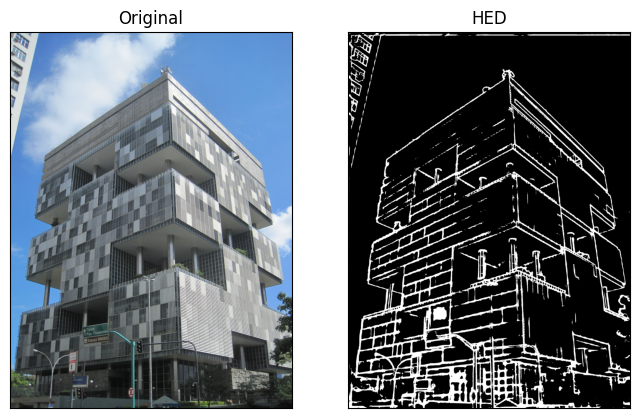

In [26]:
plt.figure(figsize=(8,6))

plt.title('Filtros clássicos de detecção de bordas')

plt.subplot(1,2,1),plt.imshow(bib_img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(hed_bib,cmap = 'gray')
plt.title('HED'), plt.xticks([]), plt.yticks([])

plt.show()

C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\4108359516.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1),plt.imshow(bib_img,cmap = 'gray')


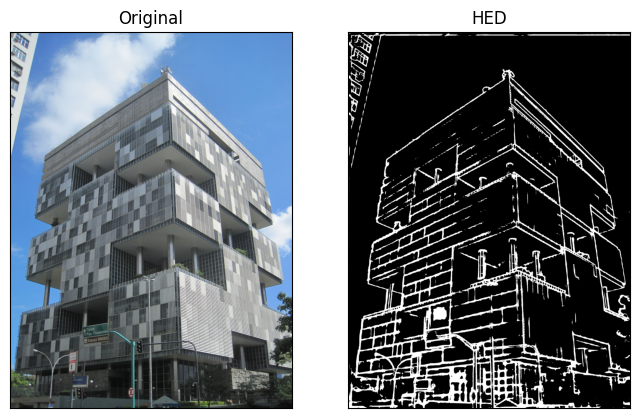

In [27]:
plt.figure(figsize=(8,6))

plt.title('Filtros clássicos de detecção de bordas')

plt.subplot(1,2,1),plt.imshow(bib_img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(hed_bib,cmap = 'gray')
plt.title('HED'), plt.xticks([]), plt.yticks([])
plt.savefig('img/bib_hed.pdf', dpi=300, bbox_inches='tight')

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_points_of_lines(lines):
    for line in lines:
        plt.plot(line[0], line[1], 'ro')
        plt.plot(line[2], line[3], 'ro',color='green')
    plt.show()


def getLines(image_path='t.png',image_opencv=None):
    if image_opencv is not None:
        img_gray = image_opencv
    else:
        img = cv2.imread(image_path)
        # Converter para escala de cinza
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # img_gray = cv2.GaussianBlur(img_gray, (5,5),cv2.BORDER_DEFAULT)

    #Create default parametrization LSD
    lsd = cv2.createLineSegmentDetector(0)

    #Detect lines in the image
    lines = lsd.detect(img_gray)[0] #Position 0 of the returned tuple are the detected lines

    lines = lines.reshape((-1,4))

    vectors = np.zeros([lines.shape[0],2])

    vectors[:,0] = lines[:,2] - lines[:,0]

    vectors[:,1] = lines[:,1] - lines[:,3]

    norm = np.linalg.norm(vectors, axis=1)

    lines = np.concatenate([lines,np.array([norm]).T],axis=1)

    # median = np.median(norm)
    # 70% big

    median = np.quantile(norm,0.7)

    idx = np.where(norm > median)[0]

    lines_fil = lines[idx,:]

    return lines_fil

def plot_lines(lines,img_path='t-color.png',return_img=False):
    img_ori = plt.imread(img_path)
    for i in range(lines.shape[0]):
        line = lines[i,:]
        plt.plot([line[0],line[2]],[line[1],line[3]],'b-')
    if return_img:
        return img_ori
    plt.imshow(img_ori)
    plt.show()


# read image from file with matplotlib

# img_ori = plt.imread(image_path+'-color.png')

#plt.imshow(img_ori)

# plotar imagem e os pontos por cima

#drawn_img = lsd.drawSegments(img_ori,lines_fil)

# plt.imshow(drawn_img)

# plot_points_of_lines(lines_fil)

C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\42329486.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,3,i),plt.imshow(types[key],cmap = 'gray')


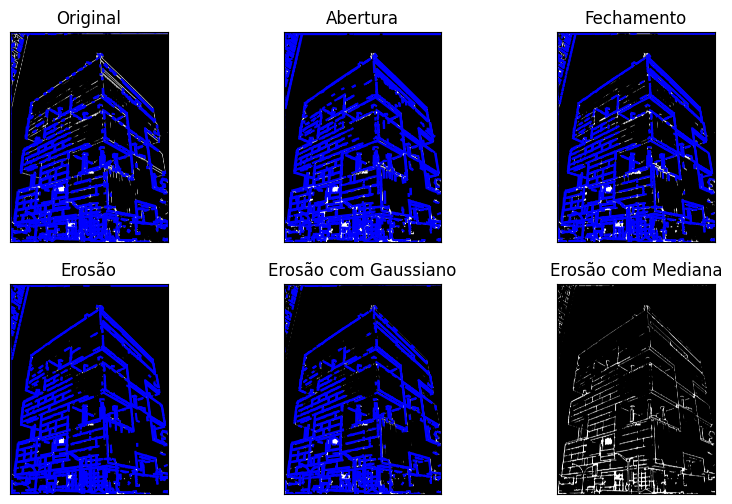

In [29]:


types = {
    "Original":hed_bib,
    "Abertura":opening,
    "Fechamento":closing,
    "Erosão":erosion,
    "Erosão com Gaussiano":blur_ero,
    "Erosão com Mediana":median_ero
}

plt.figure(figsize=(10,6))
i = 1
for key in types.keys():
    lines = getLines(image_opencv=types[key])
    img = plot_lines(lines,return_img=True,img_path=path)
    plt.subplot(2,3,i),plt.imshow(types[key],cmap = 'gray')
    plt.title(key), plt.xticks([]), plt.yticks([])
    i+=1

# export image to file

plt.savefig('img/lsd.pdf', dpi=300, bbox_inches='tight')

In [30]:
import cv2

# def img_edge_detection(img):
    # if len(img.shape) == 2:
    #     img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    # (H, W) = img.shape[:2]
    # blob = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(W, H),
    #     swapRB=False, crop=False)
    # net = cv2.dnn.readNetFromCaffe("deploy.prototxt", "hed_pretrained_bsds.caffemodel")
    # net.setInput(blob)
    # hed = net.forward()
    # hed = cv2.resize(hed[0, 0], (W, H))
    # hed = (255 * hed).astype("uint8")
    # hed = cv2.bitwise_not(hed)
    # return hed

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans


def calcula_inclinacao(pontos):
  x1, y1, x2, y2 = pontos # Desempacota os pontos da linha
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular
  return m # Retorna os valores calculados

def calcula_angulo(pontos=None,m=None):
    if type(m) == None:
        m = calcula_inclinacao(pontos)
    angulo = np.arctan(m)
    return angulo

def vetor_inclinacao(pontos):
    func = lambda x: calcula_inclinacao(x)
    return np.apply_along_axis(func, 1, pontos)

def vetor_angulo(pontos):
    func = np.vectorize(calcula_angulo)
    m = func(pontos)
    return m

def vetor_angulo_dado_m(m):
    angulo = calcula_angulo(m=m)
    return angulo

def cluster_angulo(angulo, n_clusters=2):
    # Cria o modelo
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    # Treina o modelo
    kmeans.fit(angulo)
    # Retorna os labels
    return kmeans.labels_

def filtro_inclinacao(m, alpha=2): 
    class0 = []
    class1 = []
    for i in range(m.shape[0]):
        if np.abs(m[i]) < alpha:
            class1.append(i)
        else:
            class0.append(i)
    return class0, class1

def cluster_cos_angulo(angulo, n_clusters=2):
    # Cria o modelo
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    # Treina o modelo
    kmeans.fit(-np.cos(angulo).reshape(-1, 1))
    # Retorna os labels
    return kmeans.labels_

def cluster_sin_angulo(angulo, n_clusters=2):
    # Cria o modelo
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    # Treina o modelo
    kmeans.fit(np.sin(angulo).reshape(-1, 1))
    # Retorna os labels
    return kmeans.labels_

def union_micro_segments(lines,h_):
    result = []
    for line in lines:
        for line2 in lines:
            min_x0 = min(line[0],line[2])
            max_x0 = max(line[0],line[2])
            min_y0 = min(line[1],line[3])
            max_y0 = max(line[1],line[3])
            min_x1 = min(line2[0],line2[2])
            max_x1 = max(line2[0],line2[2])
            min_y1 = min(line2[1],line2[3])
            max_y1 = max(line2[1],line2[3])

            if min_x0 - min_x1 < h_ and max_x1 - max_x0 < h_ and min_y0 - min_y1 < h_ and max_y1 - max_y0 < h_:
                result.append(line)
                break
            if max_x1 - min_x0 < h_ and max_x0 - min_x1 < h_ and max_y1 - min_y0 < h_ and max_y0 - min_y1 < h_:
                line = np.array([min_x0,min_y0,max_x1,max_y1])
                result.append(line)
                break
            if max_x0 - min_x1 < h_ and max_x1 - min_x0 < h_ and max_y0 - min_y1 < h_ and max_y1 - min_y0 < h_:
                line = np.array([min_x1,min_y1,max_x0,max_y0])
                result.append(line)
                break
    return np.array(result)
                
            
            

def cluster_naive_angulo(angulo, n_clusters=2,beta=0.1):
    # count number of angules <= beta
    count = 0
    for i in range(angulo.shape[0]):
        if np.abs(angulo[i]) <= beta:
            count += 1
    if count/angulo.shape[0] > 0.4:
        values = []
        for i in range(angulo.shape[0]):
            if np.abs(angulo[i]) <= beta:
                values.append(0)
            else:
                values.append(1)
        return np.array(values)

    values = []
    for i in range(angulo.shape[0]):
        if angulo[i] > 0:
            values.append(0)
        else:
            values.append(1)
    return np.array(values)

def cluster_naive_angulo2(angulo,lines, n_clusters=2,beta=0.1,swap=False,swapPercent=0.75):
    # count number of angules <= beta
    count = 0
    for i in range(angulo.shape[0]):
        if np.abs(angulo[i]) <= beta:
            count += 1
    if count/angulo.shape[0] > 0.4:
        values = []
        for i in range(angulo.shape[0]):
            if np.abs(angulo[i]) <= beta:
                values.append(0)
            else:
                values.append(1)
        return np.array(values)

    h = max(max(lines[:,1]),max(lines[:,3]))

    values = []
    for i in range(angulo.shape[0]):
        if angulo[i] > 0:
            if not swap:
                values.append(0)
            elif lines[i,1] > h*swapPercent or lines[i,3] > h*swapPercent:
                values.append(1)
            else:
                values.append(0)
        else:
            if not swap:
                values.append(1)
            elif lines[i,1] > h*swapPercent or lines[i,3] > h*swapPercent:
                values.append(0)
            else:
                values.append(1)
    return np.array(values)

def cluster_angulo_cos_naive(angulo, n_clusters=2):
    # Cria o modelo
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    # Treina o modelo
    kmeans.fit(np.array([np.cos(angulo),angulo]).reshape(-1, 2))
    # Retorna os labels
    return kmeans.labels_

def cluster_new_angulo(angulo, lines,n_clusters=2):
    # for each line sort the points by most up
    for i in range(lines.shape[0]):
        line = lines[i,:]
        if line[1] > line[3]:
            lines[i,:] = np.array([line[2],line[3],line[0],line[1]])
    # sort the lines by first y
    idx = np.argsort(lines[:,1])
    lines = lines[idx,:]
    angulo = angulo[idx]
    # separate the lines in groups if y1 is more than 10% of the image
    h = max(lines[:,1])
    groups = []
    group = []
    for i in range(lines.shape[0]-1):
        line1 = lines[i,:]
        line2 = lines[i+1,:]
        if line2[1] - line1[1] > 0.08*h:
            groups.append(group)
            group = []
        group.append(i)
    groups[len(groups)-1].append(i)
    labels_groups = []
    # for each group cluster the lines
    for group in groups:
        angulo_group = angulo[group]
        labels = cluster_cos_angulo(angulo_group,n_clusters=n_clusters)
        labels_groups.append(labels)
    # aggregate the labels in one array based on X position
    labels = np.zeros([lines.shape[0]])
    for i in range(len(groups)):
        group = groups[i]
        labels[group] = labels_groups[i]
    return labels.tolist()



def cluster_final(n_cluster=3,alpha=2, image_path='t',image_opencv=None):
    if image_opencv is not None:
        lines = getLines(image_opencv=image_opencv)
    else:
        lines = getLines(image_path)
    lines = lines[:,0:4]
    m = vetor_inclinacao(lines)
    angulo = vetor_angulo_dado_m(m)
    class0, class1 = filtro_inclinacao(m, alpha)
    class0 = np.array(class0)
    class1 = np.array(class1)
    labels = cluster_naive_angulo(angulo[class1], n_cluster)
    allClass = np.zeros([lines.shape[0]])
    allClass[class0] = 0
    allClass[class1] = labels + 1
    return allClass,lines

def cluster_final_new(n_cluster=3,alpha=2, image_path='t',image_opencv=None):
    if image_opencv is not None:
        lines = getLines(image_opencv=image_opencv)
    else:
        lines = getLines(image_path)
    lines = lines[:,0:4]
    m = vetor_inclinacao(lines)
    angulo = vetor_angulo_dado_m(m)
    class0, class1 = filtro_inclinacao(m, alpha)
    class0 = np.array(class0)
    class1 = np.array(class1)
    labels = cluster_naive_angulo2(angulo[class1],lines[class1], n_cluster)
    allClass = np.zeros([lines.shape[0]])
    allClass[class0] = 0
    allClass[class1] = labels + 1
    return allClass,lines

def plot_cluster(lines, labels,img_path='t-color.png',return_img=False,image_opencv=None):
    if image_opencv is not None:
        img_ori = image_opencv
    else:
        img_ori = plt.imread(img_path)
    for i in range(lines.shape[0]):
        line = lines[i,:]
        if labels[i] == 0:
            plt.plot([line[0],line[2]],[line[1],line[3]],'r-')
        elif labels[i] == 1:
            plt.plot([line[0],line[2]],[line[1],line[3]],'g-')
        else:
            plt.plot([line[0],line[2]],[line[1],line[3]],'b-')
    if return_img:
        return img_ori
    plt.imshow(img_ori)
    plt.show()

def plot_one_cluster(lines,img_path='t-color.png',return_img=False):
    img_ori = plt.imread(img_path)
    for i in range(lines.shape[0]):
        line = lines[i,:]
        plt.plot([line[0],line[2]],[line[1],line[3]],'r-')
    if return_img:
        return img_ori
    plt.imshow(img_ori)
    plt.show()

In [32]:

def cluster_final_new(n_cluster=3,alpha=2, image_path='t',image_opencv=None,swap=False,swapPercent=0.75):
    if image_opencv is not None:
        lines = getLines(image_opencv=image_opencv)
    else:
        lines = getLines(image_path)
    lines = lines[:,0:4]
    m = vetor_inclinacao(lines)
    angulo = vetor_angulo_dado_m(m)
    class0, class1 = filtro_inclinacao(m, alpha)
    class0 = np.array(class0)
    class1 = np.array(class1)
    labels = cluster_lines_angulo(angulo[class1],lines[class1], n_cluster,swap=swap,swapPercent=swapPercent)
    allClass = np.zeros([lines.shape[0]])
    allClass[class0] = 0
    allClass[class1] = labels + 1
    return allClass,lines


def cluster_lines_angulo(angulo,lines, n_clusters=2,beta=0.1,swap=False,swapPercent=0.75):
    count = 0
    for i in range(angulo.shape[0]):
        if np.abs(angulo[i]) <= beta:
            count += 1
    print(count/angulo.shape[0])
    if count/angulo.shape[0] > 0.25:
        values = []
        for i in range(angulo.shape[0]):
            if np.abs(angulo[i]) <= beta:
                values.append(0)
            else:
                values.append(1)
        return np.array(values)

    h = max(max(lines[:,1]),max(lines[:,3]))

    values = []
    for i in range(angulo.shape[0]):
        if angulo[i] > 0:
            if not swap:
                values.append(0)
            elif lines[i,1] > h*swapPercent or lines[i,3] > h*swapPercent:
                values.append(1)
            else:
                values.append(0)
        else:
            if not swap:
                values.append(1)
            elif lines[i,1] > h*swapPercent or lines[i,3] > h*swapPercent:
                values.append(0)
            else:
                values.append(1)
    return np.array(values)

def cluster_angulo_cos_naive(angulo, n_clusters=2):
    # Cria o modelo
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    # Treina o modelo
    kmeans.fit(np.array([np.cos(angulo),angulo]).reshape(-1, 2))
    # Retorna os labels
    return kmeans.labels_

In [33]:
def find_intersection(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2

    m1 = (y2 - y1) / (x2 - x1)
    b1 = y1 - m1 * x1

    m2 = (y4 - y3) / (x4 - x3)
    b2 = y3 - m2 * x3

    # Calculate intersection point
    x_intersection = (b2 - b1) / (m1 - m2)
    y_intersection = m1 * x_intersection + b1

    return x_intersection, y_intersection

In [34]:
def cluster_probabilistic(angulo,lines,w,h,beta=0.1,number_of_tests=10):
    count = 0
    for i in range(angulo.shape[0]):
        if np.abs(angulo[i]) <= beta:
            count += 1
    if count/angulo.shape[0] > 0.3:
        values = []
        for i in range(angulo.shape[0]):
            if np.abs(angulo[i]) <= beta:
                values.append(0)
            else:
                values.append(1)
        print('horizontal lines')
        return np.array(values)


    inter_points = []

    values = []

    for i in range(angulo.shape[0]):
        if angulo[i] > 0:
                values.append(0)
        else:
            values.append(1)
    i = 0
    while i < number_of_tests:
        # calculate point of intersection

        while True:
            idx1 = np.random.randint(0,len(values))
            idx2 = np.random.randint(0,len(values))
            if values[idx1] != values[idx2]:
                # check if distance is bigger than 20% of the image
                if np.abs(lines[idx1,1] - lines[idx2,1]) > 0.20*h:
                    break
                x_min_1 = min(lines[idx1,0],lines[idx1,2])
                x_min_2 = min(lines[idx2,0],lines[idx2,2])
                x_max_1 = max(lines[idx1,0],lines[idx1,2])
                x_max_2 = max(lines[idx2,0],lines[idx2,2])

                if x_min_1 - x_min_2 < 0.1*w or x_max_2 - x_max_1 < 0.1*w:
                    break

        line1 = lines[idx1,:]
        line2 = lines[idx2,:]

        x1, y1, x2, y2 = line1
        x3, y3, x4, y4 = line2

        x,y = find_intersection(line1, line2)
        
        x_min = min(x1,x2,x3,x4)
        x_max = max(x1,x2,x3,x4)

        y_min = min(y1,y2,y3,y4)
        y_max = max(y1,y2,y3,y4)

        if x < x_min - w/10 or x > x_max + w/10:
            if y > y_min or y < y_max:
                inter_points.append([x,y])

        # if x < 0 or x > w:
        #     if y < 0 and y < h_max:
        #         inter_points.append([x,y])
        i+=1
    print(len(inter_points))
    if len(inter_points) == 0:
        print('no inter points')
        return np.array(values)
    print(inter_points)
    # sep inter points in 2 groups, one more than w/2 and other less than w/2
    inter_points = np.array(inter_points)
    idx1 = np.where(inter_points[:,0] < w/2)[0]
    idx2 = np.where(inter_points[:,0] > w/2)[0]

    # calculate the mean of y for each group

    mean_y1 = np.mean(inter_points[idx1,1])
    mean_y2 = np.mean(inter_points[idx2,1])
    # check distance between inter_points and mean

    dist = []

    inter_points_1 = inter_points[idx1,:]
    inter_points_2 = inter_points[idx2,:]

    for i in range(len(inter_points_1)):
        dist.append(np.abs(inter_points_1[i,1] - mean_y1)) 

    for i in range(len(inter_points_2)):
        dist.append(np.abs(inter_points_2[i,1] - mean_y2))   

    print('dist',np.array(dist))

    # mean of dist

    mean_dist = np.mean(dist)
    print('mean',mean_dist)
    print('h',h)


    if mean_dist > h/4:
        print('Diverge')
        return np.array(values)
    else:
        print('Converge')
        return True
    

def cluster_final_prob(n_cluster=3,alpha=2, image_path='t',image_opencv=None,swap=False,swapPercent=0.75):
    if image_opencv is None:
        return False,False
    lines = getLines(image_opencv=image_opencv)
    h,w= image_opencv.shape[0:2]
    lines = lines[:,0:4]
    m = vetor_inclinacao(lines)
    angulo = vetor_angulo_dado_m(m)
    class0, class1 = filtro_inclinacao(m, alpha)
    class0 = np.array(class0)
    class1 = np.array(class1)
    print('ok')
    labels = cluster_probabilistic(angulo[class1],lines[class1],w,h)
    # return labels
    allClass = np.zeros([lines.shape[0]])
    allClass[class0] = 0
    allClass[class1] = labels + 1
    return allClass,lines

In [35]:
# img3 = plt.imread('img/petro.jpg')

# img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# # apply hed

# hed_img3 = img_edge_detection(img3)

# kernel = np.ones((10,10),np.uint8)
# closing = cv2.morphologyEx(hed_img3, cv2.MORPH_CLOSE, kernel)

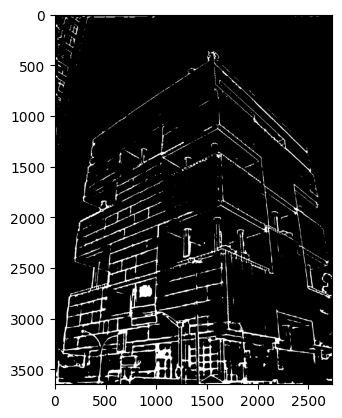

In [36]:
plt.imshow(types['Erosão com Mediana'],cmap = 'gray')

In [37]:
labels,lines = cluster_final_prob(image_opencv=types['Erosão com Mediana'])

print(erosion.shape)

# plot_cluster(lines,labels,image_opencv=erosion,return_img=False)

ok
9
[[10732.00158186343, 9.573126275983292], [4294.779773553077, 2871.5855085126914], [-129.19251886419434, 2399.1948058340354], [11984.089345613536, 3434.095453172462], [691.2498888387228, 2656.3532381473046], [4680.2606261607725, 2844.386473411915], [1471.0471339171427, 1449.8525851318113], [1630.8184527696462, 1756.2531409975766], [-2299.533385264148, 3199.310740790981]]
dist [ 352.42478909   95.26635678  447.69114587 2051.38458831  810.62779393
 1373.13773859  783.42875883  611.10512945  304.70457359]
mean 758.8634304917163
h 3648
Converge
(3648, 2736)


C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1075601521.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


In [38]:
labels,lines = cluster_final_new(image_opencv=hed_bib)


0.14885193982581155


0.14885193982581155


C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1173955719.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,3,i),plt.imshow(img,cmap = 'gray')
C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1075601521.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


0.229776247848537
0.16666666666666666
0.1716203259827421
0.1890971039182283
0.15239043824701196


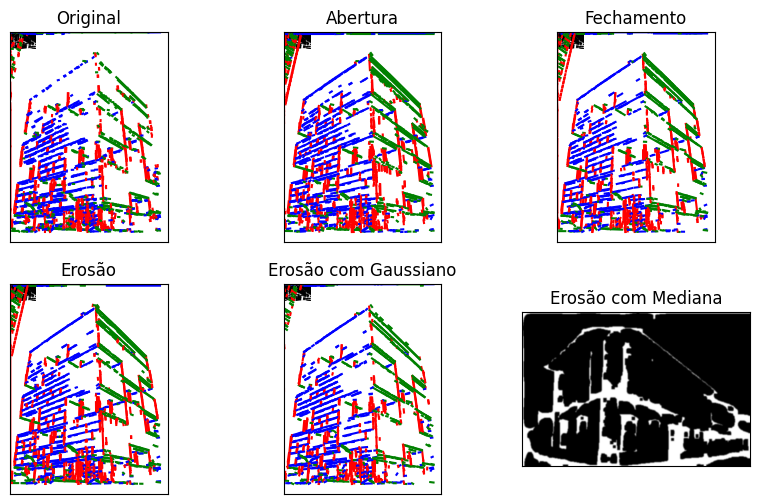

In [39]:
types = {
    "Original":hed_bib,
    "Abertura":opening,
    "Fechamento":closing,
    "Erosão":erosion,
    "Erosão com Gaussiano":blur_ero,
    "Erosão com Mediana":median_ero
}

plt.figure(figsize=(10,6))
i = 1
for key in types.keys():
    labels,lines = cluster_final_new(image_opencv=types[key])
    img = plot_cluster(lines,labels,return_img=True,img_path='img/blur_ero.png')
    plt.subplot(2,3,i),plt.imshow(img,cmap = 'gray')
    plt.title(key), plt.xticks([]), plt.yticks([])
    i+=1

# export image to file

plt.savefig('img/lsd.pdf', dpi=300, bbox_inches='tight')

0.4523809523809524


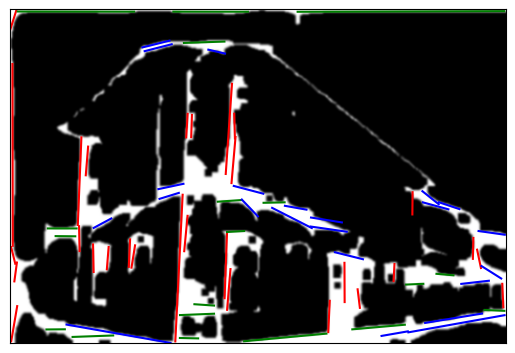

In [40]:
img2 = plt.imread('img/paraty.jpeg')

img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# apply hed

hed_img2 = img_edge_detection(img2)

# apply erosion

kernel = np.ones((9,9),np.uint8)

erosion = cv2.erode(hed_img2,kernel)

# apply blur

blur_ero = cv2.GaussianBlur(erosion,(5,5),0)


labels,lines = cluster_final_new(image_opencv=blur_ero,swap=True)
img = plot_cluster(lines,labels,return_img=True,img_path='img/blur_ero.png')
plt.imshow(img,cmap = 'gray'), plt.xticks([]), plt.yticks([])

plt.savefig('img/inverse.pdf', dpi=300, bbox_inches='tight')

In [41]:
print(erosion.shape)

(319, 474)


ok
horizontal lines


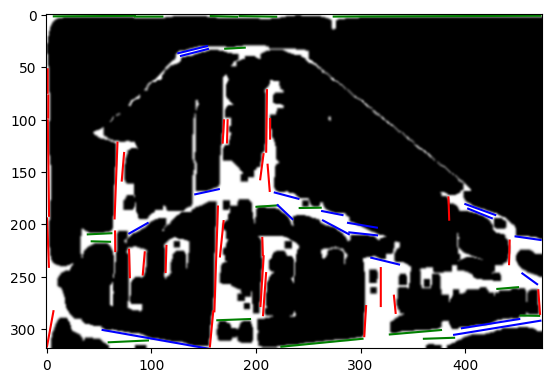

In [42]:
labels,lines = cluster_final_prob(image_opencv=erosion)

plot_cluster(lines,labels,return_img=False,img_path='img/blur_ero.png')


C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1075601521.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


0.20361990950226244


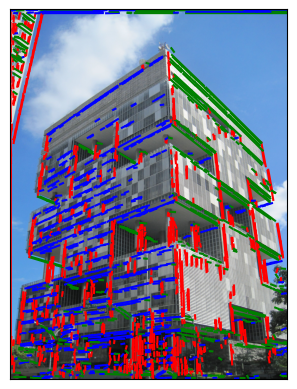

In [43]:
img3 = plt.imread('img/petro.jpg')

img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# apply hed

hed_img3 = img_edge_detection(img3)

# apply erosion

kernel = np.ones((10,10),np.uint8)
closing = cv2.morphologyEx(hed_bib, cv2.MORPH_CLOSE, kernel)

labels,lines = cluster_final_new(image_opencv=closing,swap=False)
img = plot_cluster(lines,labels,return_img=True,img_path='img/petro.jpg')
plt.imshow(img,cmap = 'gray'), plt.xticks([]), plt.yticks([])

plt.savefig('img/normal.pdf', dpi=300, bbox_inches='tight')

In [44]:
img3 = plt.imread('img/salvador.jpg')

# img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# # apply hed

# hed_img3 = img_edge_detection(img3)

# # save as pdf

plt.imsave('img/horizonte.png', hed_img3, cmap='gray')

# apply closing


In [45]:

kernel = np.ones((9,9),np.uint8)

closing = cv2.morphologyEx(hed_img3, cv2.MORPH_CLOSE, kernel)

labels,lines = cluster_final_prob(image_opencv=closing,swap=False)
# img = plot_cluster(lines,labels,return_img=True,img_path='img/horizonte.png')
# plt.imshow(img,cmap = 'gray'), plt.xticks([]), plt.yticks([])
# plt.savefig('img/horizonte2.pdf', dpi=300, bbox_inches='tight')

ok
3
[[-1432.4523295487566, 2846.60217814755], [2550.2683431978885, 1425.21307414572], [3764.548449762187, 2238.6018559348786]]
dist [  0.         406.69439089 406.69439089]
mean 271.12959392971953
h 3648
Converge


C:\Users\emanu\AppData\Local\Temp\ipykernel_26948\1075601521.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


In [46]:
img3 = plt.imread('img/.jpg')

img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# apply hed

hed_img3 = img_edge_detection(img3)

plt.imshow(hed_img3,cmap = 'gray')

# # apply erosion

# kernel = np.ones((6,6),np.uint8)

# erosion = cv2.erode(hed_img3,kernel)


# labels,lines = cluster_final_new(image_opencv=erosion,swap=False)
# img = plot_cluster(lines,labels,return_img=True,img_path='img/blur_ero.png')
# plt.imshow(img,cmap = 'gray'), plt.xticks([]), plt.yticks([])

FileNotFoundError: [Errno 2] No such file or directory: 'img/.jpg'

In [ ]:
labels_2 = labels[labels==2]

labels_2

array([2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2.])

In [ ]:
from scripts.camera_calibration import *
import json

In [ ]:
# write labels lines as a json with for each class a list of lines

def lines2list(labels,lines):
    list_lines = []
    for i in range(3,0,-1):
        aux = []
        for j in range(labels[labels==i].shape[0]):
            aux.append(lines[j,0:2].tolist())
            aux.append(lines[j,2:4].tolist())
        list_lines.append(aux)
    return list_lines

def final_dict(labels,lines,path):
    result = {}
    result['pontosguia'] = lines2list(labels,lines)
    result['nomeImagem'] = path.split('/')[-1].split('.')[0]
    result['extensao'] = path.split('.')[-1]
    cab_type, missing_idx = getCalibType(result)
    getVanishingPoints(result, missing_idx)
    getOpticalCenter(result, missing_idx)
    result["tiposPlanos"] = dict()
    result["planos"]= "[]"
    return result

def write_json(result,path):
    js = json.dumps(result)
    fp = open(path, 'w')
    fp.write(js)
    

In [ ]:
result = final_dict(labels,lines,path)

write_json(result,'calib/ex.json')

c:\Users\emanu\OneDrive\Documentos\fgv\tcc\my-tcc\exemplosParaTCC\scripts\camera_calibration.py:168: RuntimeWarning: invalid value encountered in sqrt
  z2 = -1 * np.sqrt(z2/2)


C:\Users\emanu\AppData\Local\Temp\ipykernel_18920\3621739969.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.imshow(img0,cmap = 'gray'),plt.subplot(1,3,1),plt.title("Saída da detecção de arestas"), plt.xticks([]), plt.yticks([])


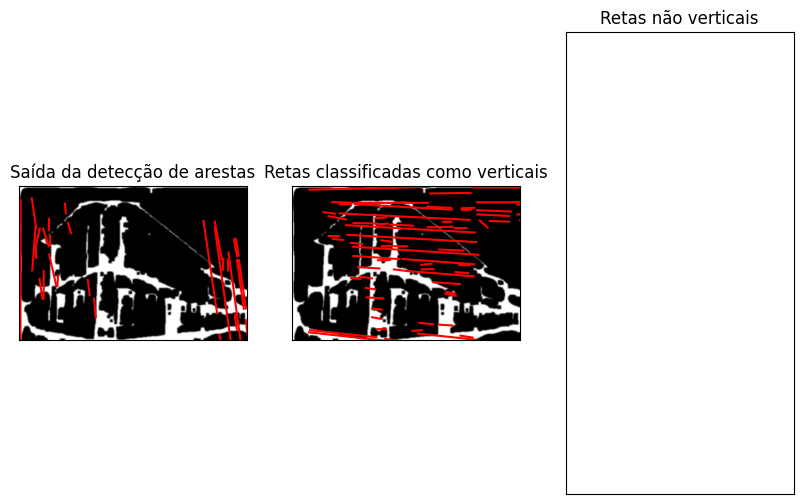

In [ ]:

lines = getLines(image_opencv=blur_ero)
lines = lines[:,0:4]
m = vetor_inclinacao(lines)
angulo = vetor_angulo_dado_m(m)
class0, class1 = filtro_inclinacao(m, 2)

lines1 = lines[class0,:]
lines2 = lines[class1,:]

lines = np.array(lines)
lines1 = np.array(lines1)
lines2 = np.array(lines2)

# # save pdf hed_bib and vertical lines and horizontal lines separated
plt.figure(figsize=(10,6))

img0 = plot_one_cluster(lines,return_img=True,img_path='img/blur_ero.png')
plt.imshow(img0,cmap = 'gray'),plt.subplot(1,3,1),plt.title("Saída da detecção de arestas"), plt.xticks([]), plt.yticks([])

img1 = plot_one_cluster(lines1,return_img=True,img_path='img/blur_ero.png')
plt.imshow(img1,cmap = 'gray'),plt.subplot(1,3,2),plt.title("Retas classificadas como verticais"), plt.xticks([]), plt.yticks([])



img2 = plot_one_cluster(lines2,return_img=True,img_path='img/blur_ero.png')
plt.imshow(img2,cmap = 'gray'),plt.subplot(1,3,3),plt.title("Retas não verticais"), plt.xticks([]), plt.yticks([])

# save pdf

plt.savefig('img/vert.pdf', dpi=300, bbox_inches='tight')

C:\Users\emanu\AppData\Local\Temp\ipykernel_18920\612198165.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,3,i),plt.imshow(img,cmap = 'gray')


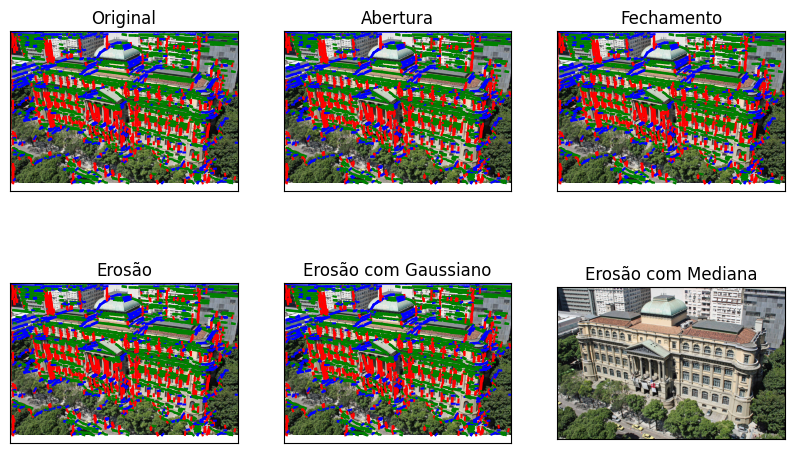

In [ ]:


types = {
    "Original":hed_bib,
    "Abertura":opening,
    "Fechamento":closing,
    "Erosão":erosion,
    "Erosão com Gaussiano":blur_ero,
    "Erosão com Mediana":median_ero
}

plt.figure(figsize=(10,6))
i = 1
for key in types.keys():
    labels,lines = cluster_final(image_opencv=blur_ero)
    img = plot_cluster(lines,labels,img_path=path,return_img=True)
    plt.subplot(2,3,i),plt.imshow(img,cmap = 'gray')
    plt.title(key), plt.xticks([]), plt.yticks([])
    i+=1

# export image to file

plt.savefig('img/lsd.pdf', dpi=300, bbox_inches='tight')

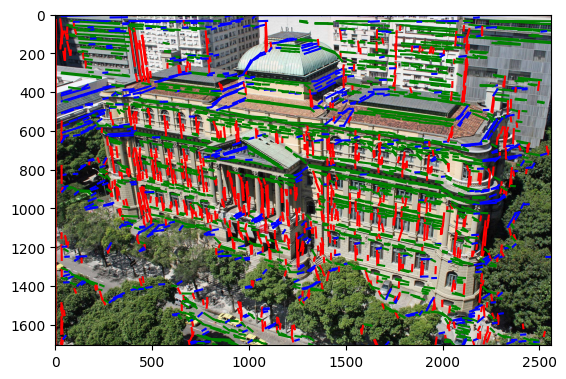

In [ ]:
labels,lines = cluster_final(image_opencv=blur_ero)

plot_cluster(lines,labels,img_path=path)

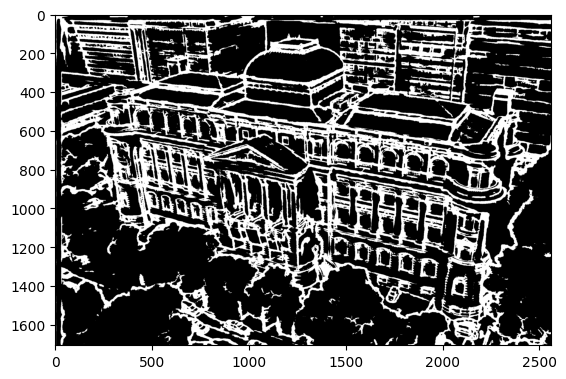

In [ ]:
hed_bib = img_edge_detection(bib_img)

plt.imshow(hed_bib, cmap='gray')

C:\Users\emanu\AppData\Local\Temp\ipykernel_18920\4165059021.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


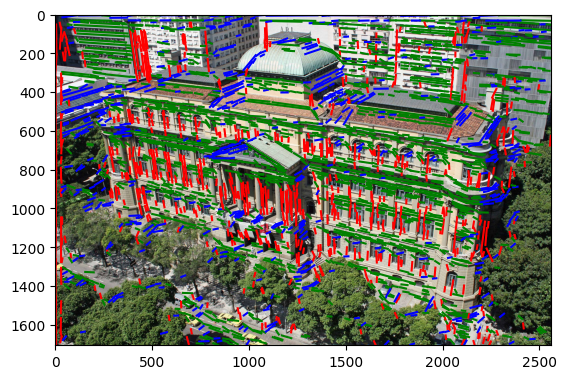

In [ ]:
labels,lines = cluster_final(image_opencv=hed_bib)

plot_cluster(lines,labels,img_path=path)

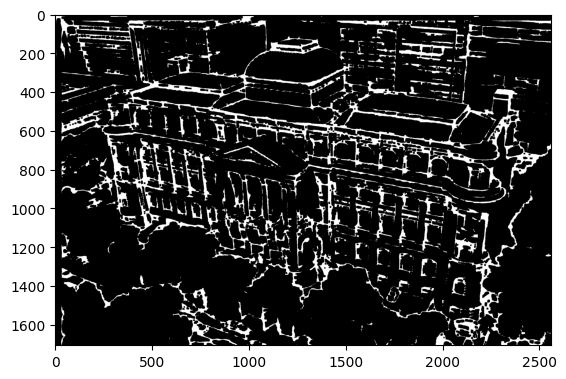

In [ ]:
kernel = np.ones((7,7),np.uint8)
erosion = cv2.erode(hed_bib,kernel)


plt.imshow(erosion,cmap = 'gray')


C:\Users\emanu\AppData\Local\Temp\ipykernel_18920\4165059021.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


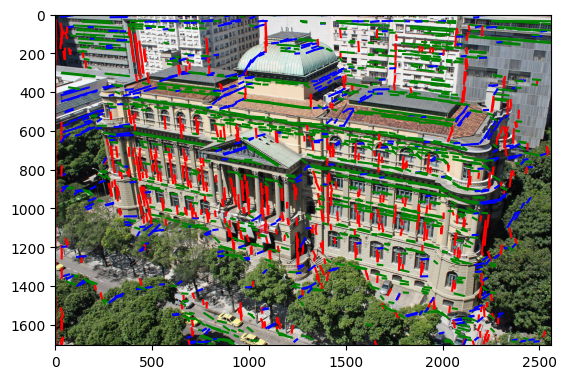

In [ ]:
labels,lines = cluster_final(image_opencv=erosion)

plot_cluster(lines,labels,img_path=path)

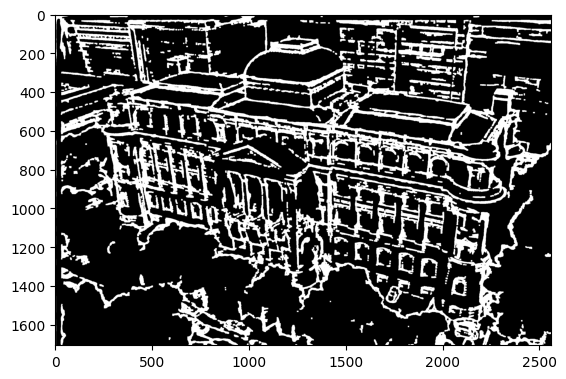

In [ ]:
opening = cv2.morphologyEx(hed_bib, cv2.MORPH_OPEN, kernel)

plt.imshow(opening,cmap = 'gray')

C:\Users\emanu\AppData\Local\Temp\ipykernel_18920\4165059021.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


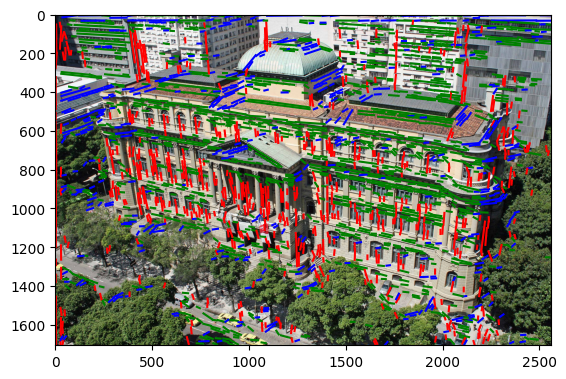

In [ ]:
labels,lines = cluster_final(image_opencv=opening)

plot_cluster(lines,labels,img_path=path)

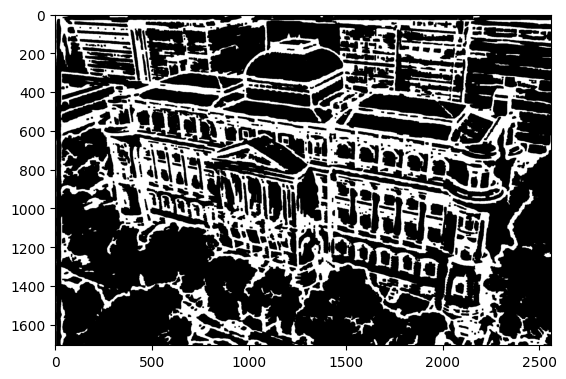

In [ ]:
closing = cv2.morphologyEx(hed_bib, cv2.MORPH_CLOSE, kernel)

plt.imshow(closing,cmap = 'gray')

C:\Users\emanu\AppData\Local\Temp\ipykernel_18920\4165059021.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  m = (y2 - y1) / (x2 - x1) # Calcula o coeficiente angular


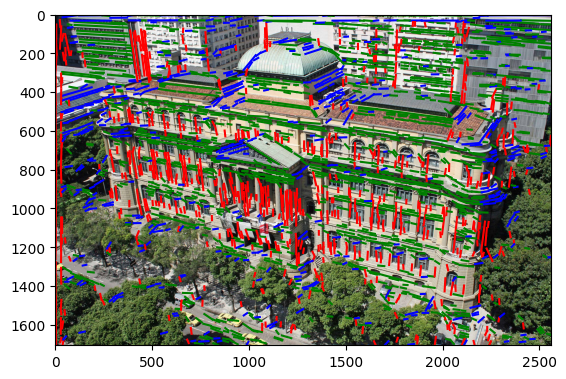

In [ ]:
labels,lines = cluster_final(image_opencv=closing)

plot_cluster(lines,labels,img_path=path)

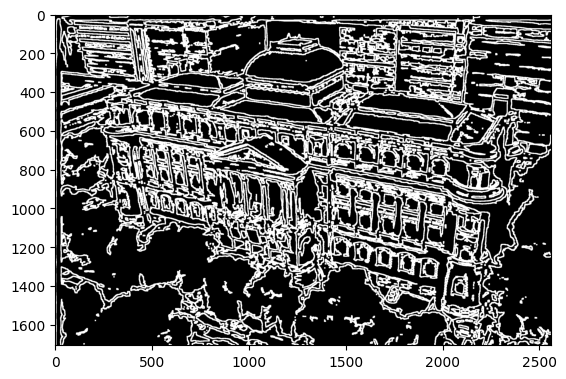

In [ ]:
grad = cv2.morphologyEx(hed_bib, cv2.MORPH_GRADIENT, kernel)


plt.imshow(grad,cmap = 'gray')

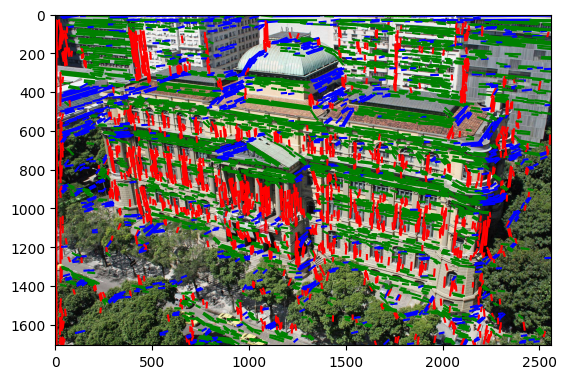

In [ ]:
labels,lines = cluster_final(image_opencv=grad)

plot_cluster(lines,labels,img_path=path)